This Jupyter Notebook investigates SAR images

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from tifffile import tifffile
from PIL import Image
import os
import math

Each SAR image comes with a compressed png image preview called quick-look.png. Here I upload one of the quick-look images for a preview. The quick-look images are calor-added to look like optical images.

In [3]:
quicklook_path = "/data/sar/sentinel-1-data/S1A_IW_GRDH_1SDV_20240113T020752_20240113T020817_052082_064B71_F97A.SAFE/preview/"
quicklook = "quick-look.png"

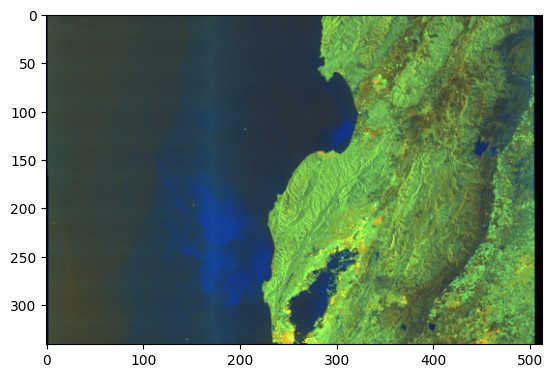

In [4]:
im_quicklook = Image.open(quicklook_path+quicklook)
plt.imshow(im_quicklook)

In [5]:
# Image.MAX_IMAGE_PIXELS = None

In [6]:
sar_path = '/data/sar/sar_data/SAR_TIFF/'
filename = 's1a-iw-grd-vh-20240113t020752-20240113t020817-052082-064b71-002.tiff'
sarimage = sar_path + filename


In [7]:
# Open SAR tiff file:
image = tifffile.imread(sarimage)
print(image.shape)

imarray = np.array(image)
print(imarray.shape)

(16696, 25771)
(16696, 25771)


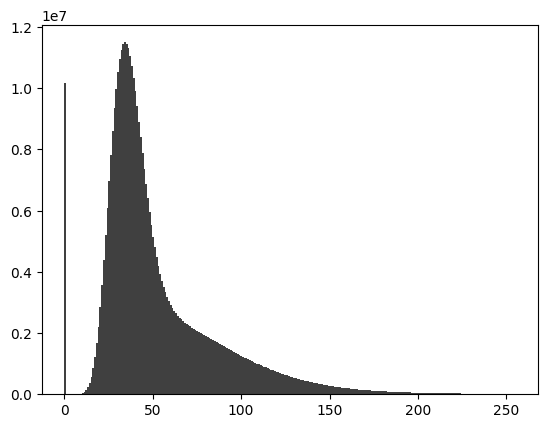

In [8]:
# Image pixel value distribution:
pixel_values = image.flatten()
plt.hist(pixel_values, bins = 256, range=(0, 255), alpha = 0.75, color='black');

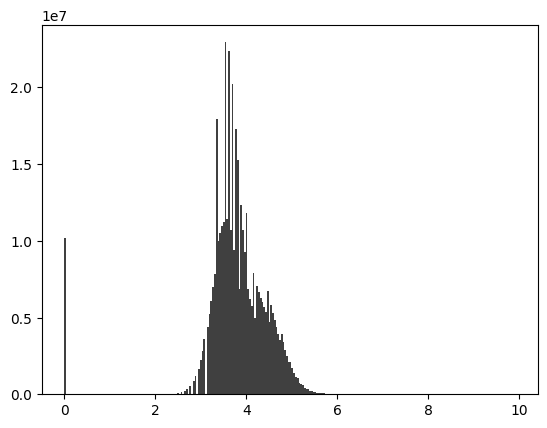

In [9]:
# Image pixel value distribution, log-transformed:
plt.hist(np.log1p(pixel_values), bins = 256, alpha = 0.75, color='black');

Text(0.5, 0.98, 'Sentinel-1 Images Color Intensity Distribution')

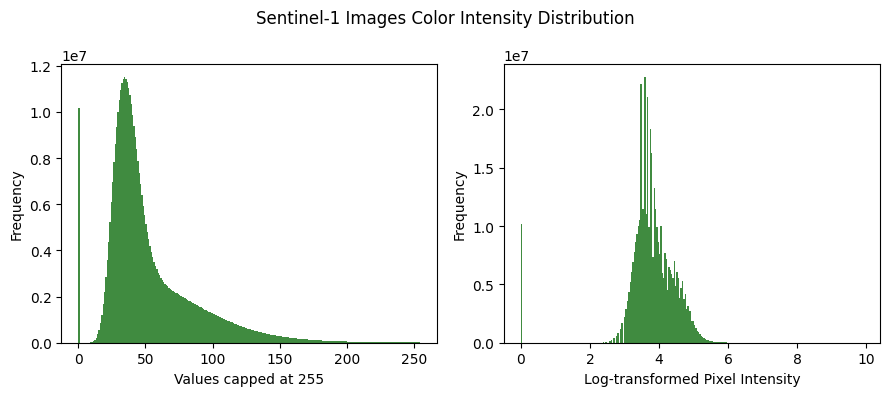

In [10]:
fig, axs = plt.subplots(1, 2, tight_layout=True)
fig.set_size_inches(9, 4)

pixel_values = image.flatten()
axs[0].hist(pixel_values, bins = 255, range=(0, 255), alpha = 0.75, color='darkgreen');

log_image = np.log1p(image)
pixel_values_log = log_image.flatten()
axs[1].hist(pixel_values_log, bins = 255, alpha=0.75, color= 'darkgreen');
# axs[0].title('Log-transformed Pixel Value Distribution')
axs[0].set_xlabel('Values capped at 255')
axs[1].set_xlabel('Log-transformed Pixel Intensity')

axs[0].set_ylabel('Frequency')
axs[1].set_ylabel('Frequency')

plt.suptitle('Sentinel-1 Images Color Intensity Distribution')

#plt.savefig('sar_pixel_distribution.png', dpi=300)

In [11]:
print("Min: ", np.min(image))
print("Max: ", np.max(image))
print(type(image))
print("Mean: ", np.mean(image))
print("Median: ", np.median(image))
print("25th percentile: ", np.percentile(image, 25))
print("75th percentile: ", np.percentile(image, 75))

Min:  0
Max:  20105
<class 'numpy.ndarray'>
Mean:  53.19752022982564
Median:  42.0
25th percentile:  32.0
75th percentile:  65.0


In [12]:
is_nan = np.isnan(image)
has_nan = np.any(is_nan)
print(has_nan)

False


SAR images pixel values range from 0 to 20,105 (instead of 0-255). Therefore the image appears all black unless color corrected.
Here I am testing two different ways to color corect the images.

In [13]:
img_copy = image.copy()
A=np.abs(image)
Am=np.mean(A)
As=np.std(np.abs(A))

Alo, Ahi = np.percentile(A, [5,95])

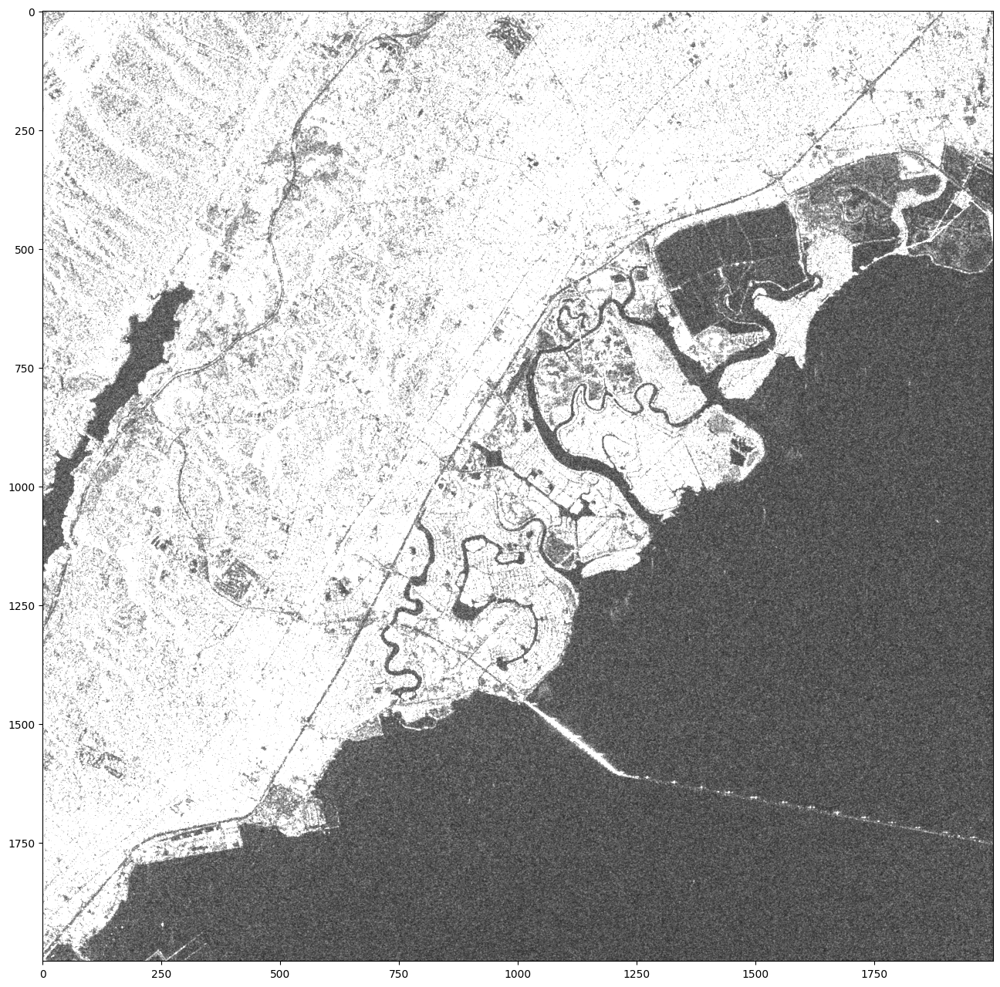

In [14]:
plt.figure(figsize=(16,16))
plt.imshow(np.abs(A[12500:14500, 12500:14500]),cmap='gray',vmin=0,vmax=Am+As)

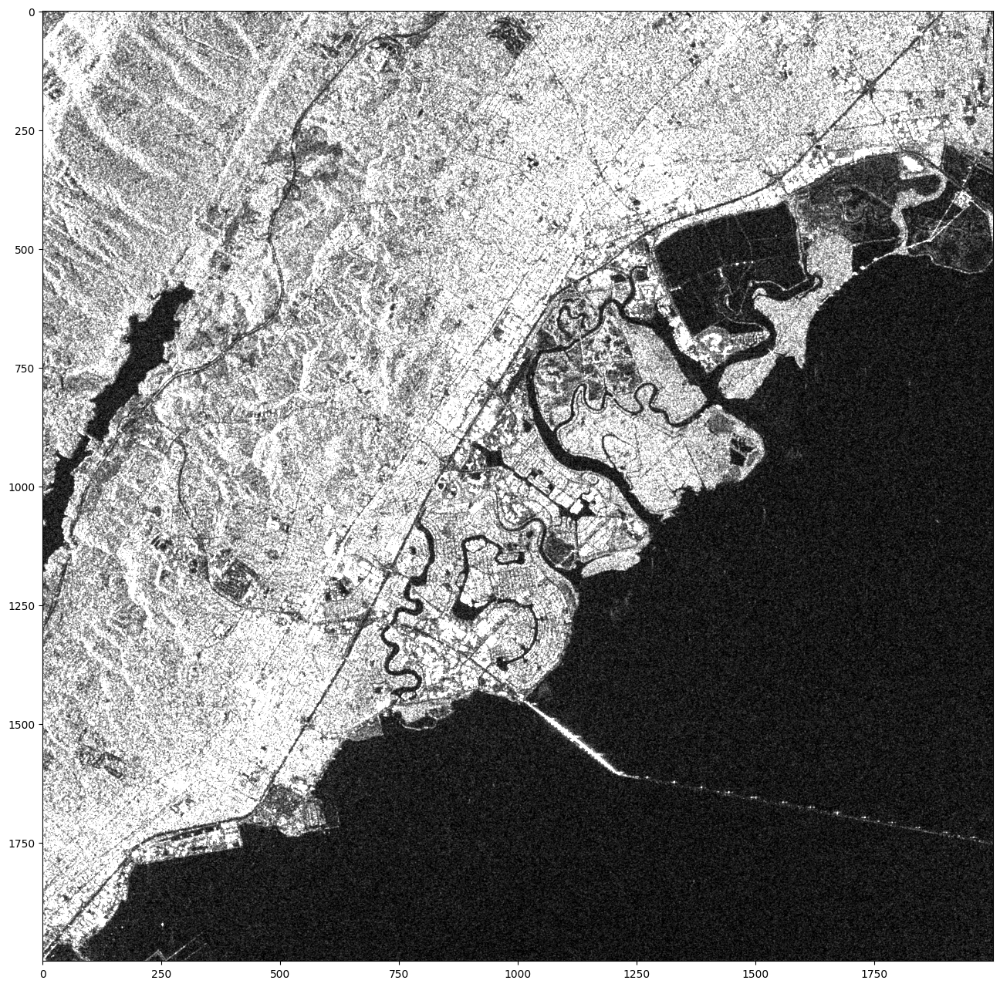

In [15]:
plt.figure(figsize=(16,16))
plt.imshow(np.abs(A[12500:14500, 12500:14500]),cmap='gray',vmin=Alo,vmax=Ahi)

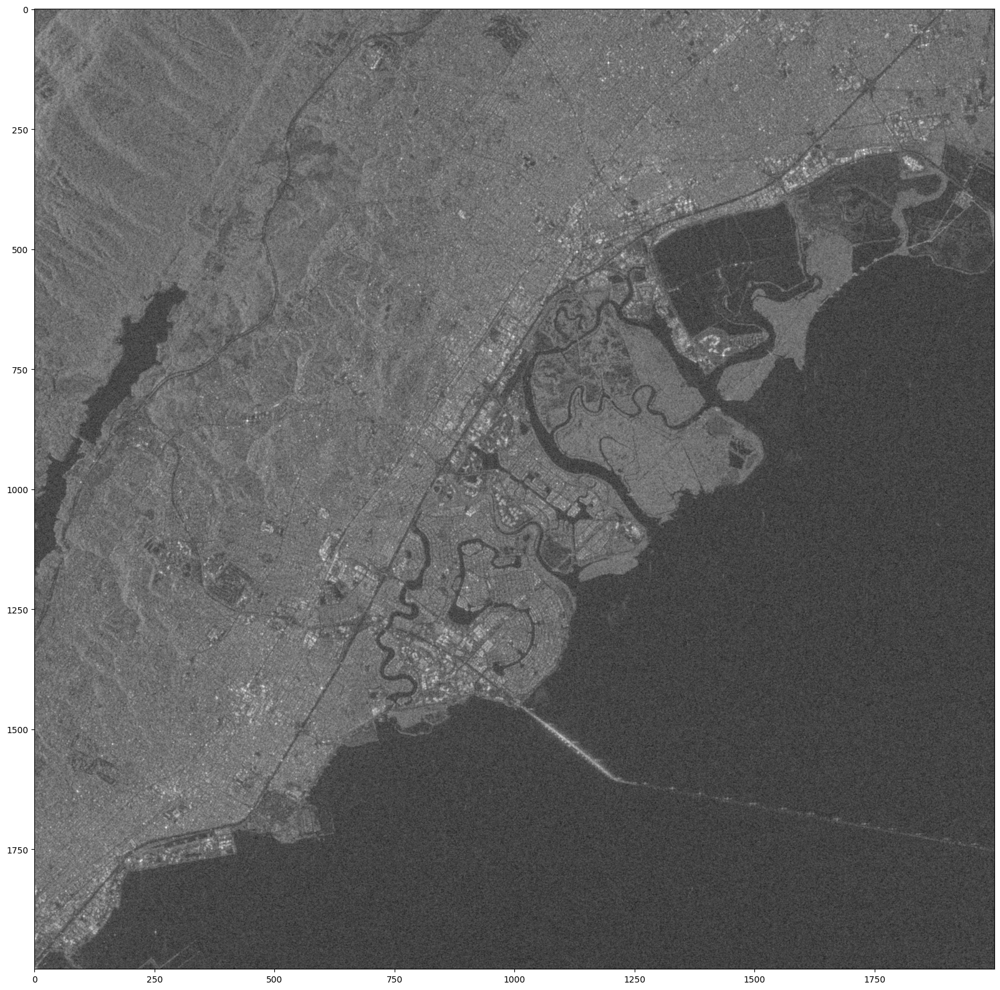

In [16]:
plt.figure(figsize=(20,20))
plt.imshow(20*np.log10(np.abs(image[12500:14500, 12500:14500])),cmap='gray')

In [17]:
# plt.figure(figsize=(20,20))
# plt.imshow(20*np.log10(np.abs(image[14000:16000, 12000:14000])),cmap='gray')

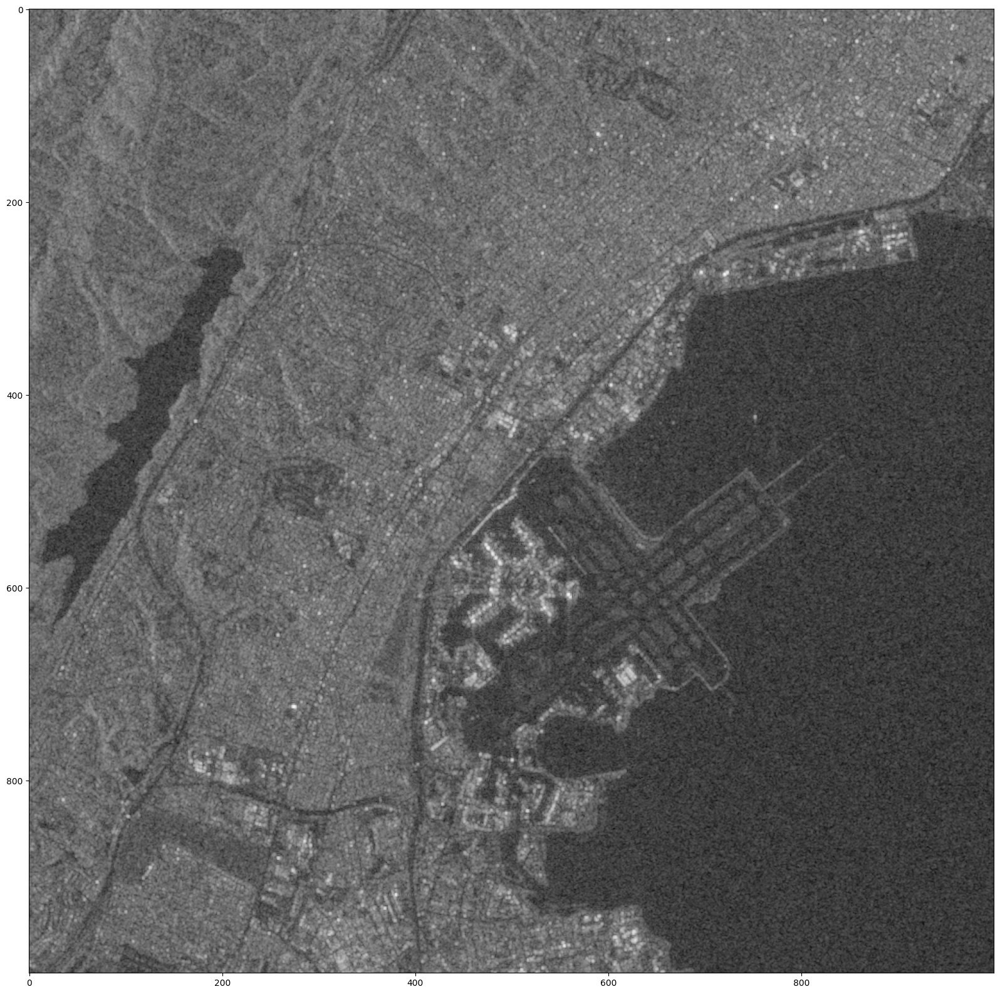

In [18]:
plt.figure(figsize=(20,20))
plt.imshow(20*np.log10(np.abs(image[14000:15000, 12000:13000])),cmap='gray')

Text(0.5, 1.0, '(5, 95) Percentile conversion')

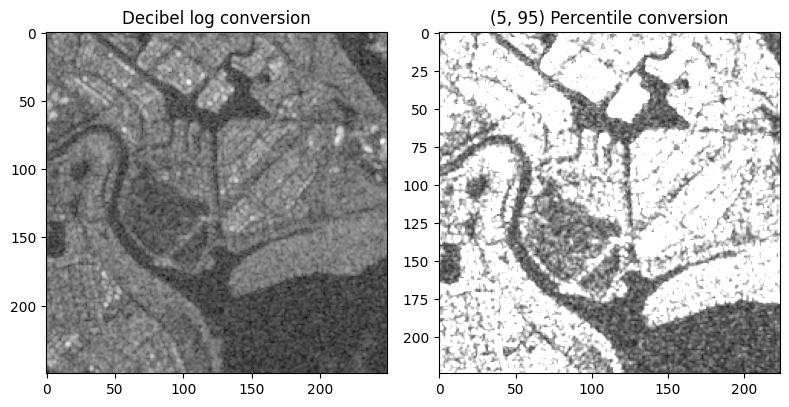

In [19]:
fig, axs = plt.subplots(1, 2, tight_layout=True, figsize=(8, 5))
axs[0].imshow(20*np.log10(np.abs(image[13500:13750, 13500:13750])),cmap='gray')
axs[1].imshow(np.abs(A[13500:13724, 13500:13724]),cmap='gray',vmin=0,vmax=Am+As)
axs[0].set_title("Decibel log conversion")
axs[1].set_title("(5, 95) Percentile conversion")
# plt.savefig('./data/images/sar_sample_image.png', dpi=300)

In [21]:
# Calculating dimensions for visualization:
arr_quick = np.array(im_quicklook)
print(arr_quick.shape)
print(imarray.shape)
print(16696/2, 25771/3, 25771/3*2)
print(341/2, 513/3, 513/3*2)

(341, 513, 3)
(16696, 25771)
8348.0 8590.333333333334 17180.666666666668
170.5 171.0 342.0


Text(0.5, 1.0, '(5, 95) Percentile conversion \n amplitude correction')

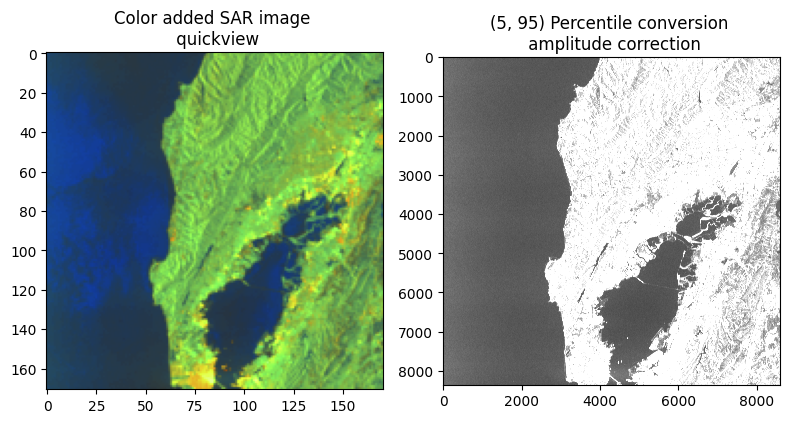

In [22]:
fig, axs = plt.subplots(1, 2, tight_layout=True, figsize=(8, 5))
axs[0].imshow(arr_quick[170:341, 171:342,:], cmap='gray')
axs[1].imshow(np.abs(A[8348:16696, 8590:17181]),cmap='gray',vmin=0,vmax=Am+As)
    
axs[0].set_title("Color added SAR image \n quickview")
axs[1].set_title("(5, 95) Percentile conversion \n amplitude correction")
# plt.savefig('./data/images/sar_sample_image2.png', dpi=300)
